In [1]:
import mne
import matplotlib.pyplot as plt
import numpy as np

from scipy.signal import spectrogram, get_window
from IPython.display import Audio

# Función para graficar el espectrograma
def plot_spectrogram(signal, sample_rate, overlapping = 0., window_type='hann', window_size=256):
    """
    Genera y grafica el espectrograma de una señal.

    Parámetros:
    - signal: la señal de audio
    - window_type: el tipo de ventana a usar (string, por ejemplo 'hann', 'hamming', etc.)
    - window_size: tamaño de la ventana (entero)
    - overlapping: porcentaje de solapamiento (valor entre 0 y 1)
    - fs: frecuencia de muestreo de la señal
    """
    # Crear la ventana
    window = get_window(window_type, window_size)

    # Calcular el paso de la ventana en función del solapamiento
    noverlap = int(overlapping * window_size)

    # Calcular el espectrograma usando scipy.signal.spectrogram
    f, t, Sxx = spectrogram(signal, fs=sample_rate, window=window,
                            nperseg=window_size, noverlap=noverlap)


    # Graficar el espectrograma
    plt.figure(figsize=(10, 6))
    plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud')
    plt.title('Espectrograma')
    plt.ylabel('Frecuencia [Hz]')
    plt.xlabel('Tiempo [s]')
    plt.colorbar(label='Amplitud [dB]')
    plt.show()


In [2]:
import wfdb
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import spectrogram, get_window

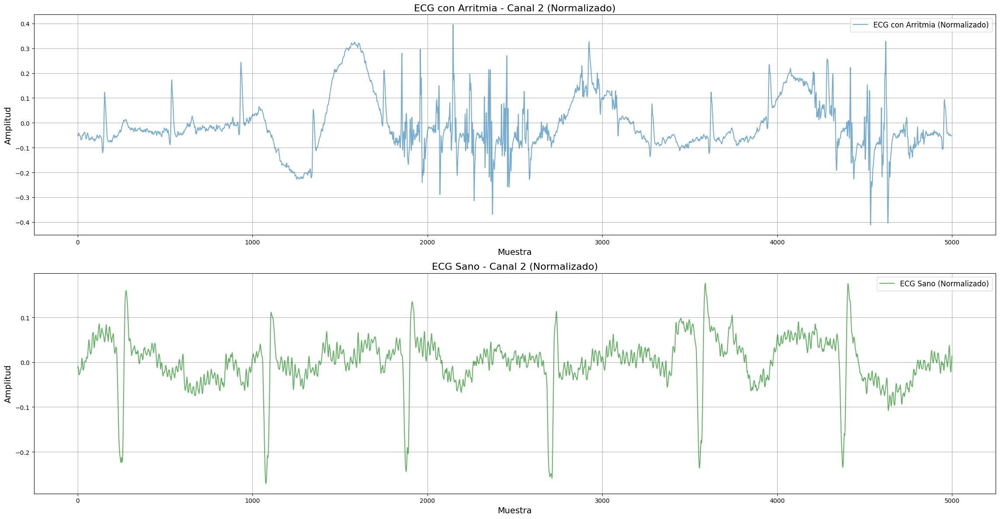

In [3]:
# Asumiendo que arr_signals contiene la señal de ECG con arritmia
# Nombre del archivo sin extensión
record_name = 'NIFAECG/ARR_06'

# Cargar el archivo .dat y su metainformación
record = wfdb.rdrecord(record_name)

# Acceder a los datos de la señal (todas las señales)
arr_signals = record.p_signal[1200:6200, :]  # Cargar un segmento específico
n_channels = arr_signals.shape[1]  # Número de canales

# Y que nr_signals contiene la señal de ECG sana
# Nombre del archivo sin extensión
record_name = 'NIFAECG/NR_06'

# Cargar el archivo .dat y su metainformación
record = wfdb.rdrecord(record_name)

# Acceder a los datos de la señal (todas las señales)
nr_signals = record.p_signal[1200:6200, :]  # Cargar un segmento específico
n_channels = nr_signals.shape[1]  # Número de canales

# Normalizar las señales
arr_signals = arr_signals / np.max(np.abs(arr_signals))
nr_signals = nr_signals / np.max(np.abs(nr_signals))

# Graficar el canal 1 de ECG sano junto al canal 1 de ECG con arritmia después de la normalización
plt.figure(figsize=(23, 12))

# Graficar ECG con arritmia en la parte superior
plt.subplot(2, 1, 1)
plt.plot(arr_signals[:, 2], label='ECG con Arritmia (Normalizado)', alpha=0.6)
plt.xlabel('Muestra', fontsize=14)
plt.ylabel('Amplitud', fontsize=14)
plt.title('ECG con Arritmia - Canal 2 (Normalizado)', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)

# Graficar ECG sano en la parte inferior
plt.subplot(2, 1, 2)
plt.plot(nr_signals[:, 2], label='ECG Sano (Normalizado)', alpha=0.6, color='green')
plt.xlabel('Muestra', fontsize=14)
plt.ylabel('Amplitud', fontsize=14)
plt.title('ECG Sano - Canal 2 (Normalizado)', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)

plt.tight_layout()
plt.show()

In [4]:
# Generar ruido eléctrico (50 Hz)
def generate_electrical_noise(frequency, sample_rate, duration, amplitude=0.1):
    t = np.arange(0, duration, 1/sample_rate)
    noise = amplitude * np.sin(2 * np.pi * frequency * t)
    return noise

# Generar ruido EMG (ruido blanco)
def generate_emg_noise(sample_rate, num_samples, amplitude=0.05):
    emg_noise = amplitude * np.random.normal(0, 1, num_samples)
    return emg_noise

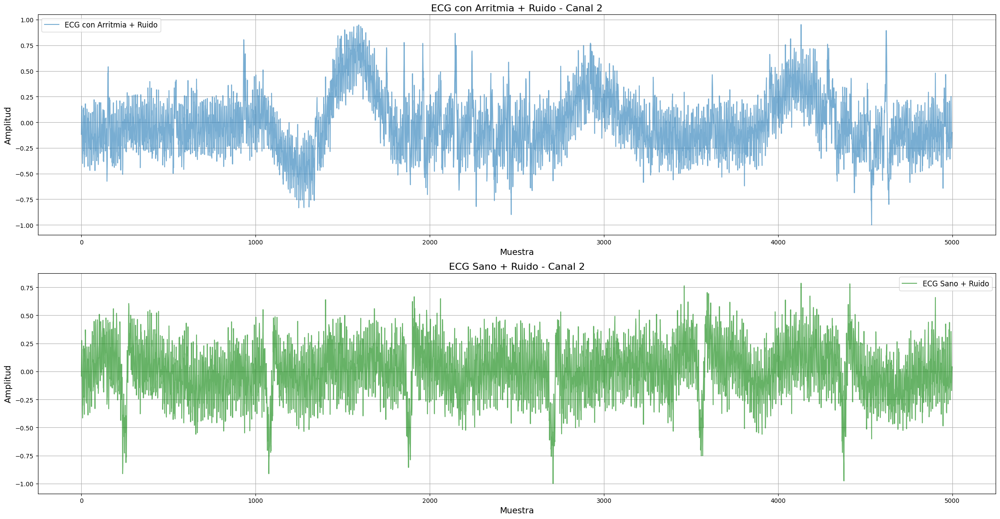

In [5]:
# Parámetros para generar ruido
frequency_noise = 50  # Frecuencia del ruido eléctrico en Hz
sample_rate = 500  # Frecuencia de muestreo en Hz
duration = (6200 - 1200) / sample_rate  # Duración del segmento de señal en segundos
num_samples = arr_signals.shape[0]  # Número de muestras

# Generar ruido eléctrico
electrical_noise = generate_electrical_noise(frequency_noise, sample_rate, duration)

# Generar ruido EMG
emg_noise = generate_emg_noise(sample_rate, num_samples)

# Asegurar que los ruidos tengan la misma longitud que los canales de la señal
electrical_noise = electrical_noise[:num_samples]
emg_noise = emg_noise[:num_samples]

# Agregar el ruido al canal 2 de ambas señales (puedes cambiar de canal si lo prefieres)
noisy_arr_signal = arr_signals[:, 2] + electrical_noise + emg_noise
noisy_nr_signal = nr_signals[:, 2] + electrical_noise + emg_noise

# Normalizar nuevamente después de agregar ruido
noisy_arr_signal /= np.max(np.abs(noisy_arr_signal))
noisy_nr_signal /= np.max(np.abs(noisy_nr_signal))

# Graficar las señales con ruido
plt.figure(figsize=(23, 12))

# Graficar ECG con arritmia y ruido
plt.subplot(2, 1, 1)
plt.plot(noisy_arr_signal, label='ECG con Arritmia + Ruido', alpha=0.6)
plt.xlabel('Muestra', fontsize=14)
plt.ylabel('Amplitud', fontsize=14)
plt.title('ECG con Arritmia + Ruido - Canal 2', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)

# Graficar ECG sano y ruido
plt.subplot(2, 1, 2)
plt.plot(noisy_nr_signal, label='ECG Sano + Ruido', alpha=0.6, color='green')
plt.xlabel('Muestra', fontsize=14)
plt.ylabel('Amplitud', fontsize=14)
plt.title('ECG Sano + Ruido - Canal 2', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)

plt.tight_layout()
plt.show()

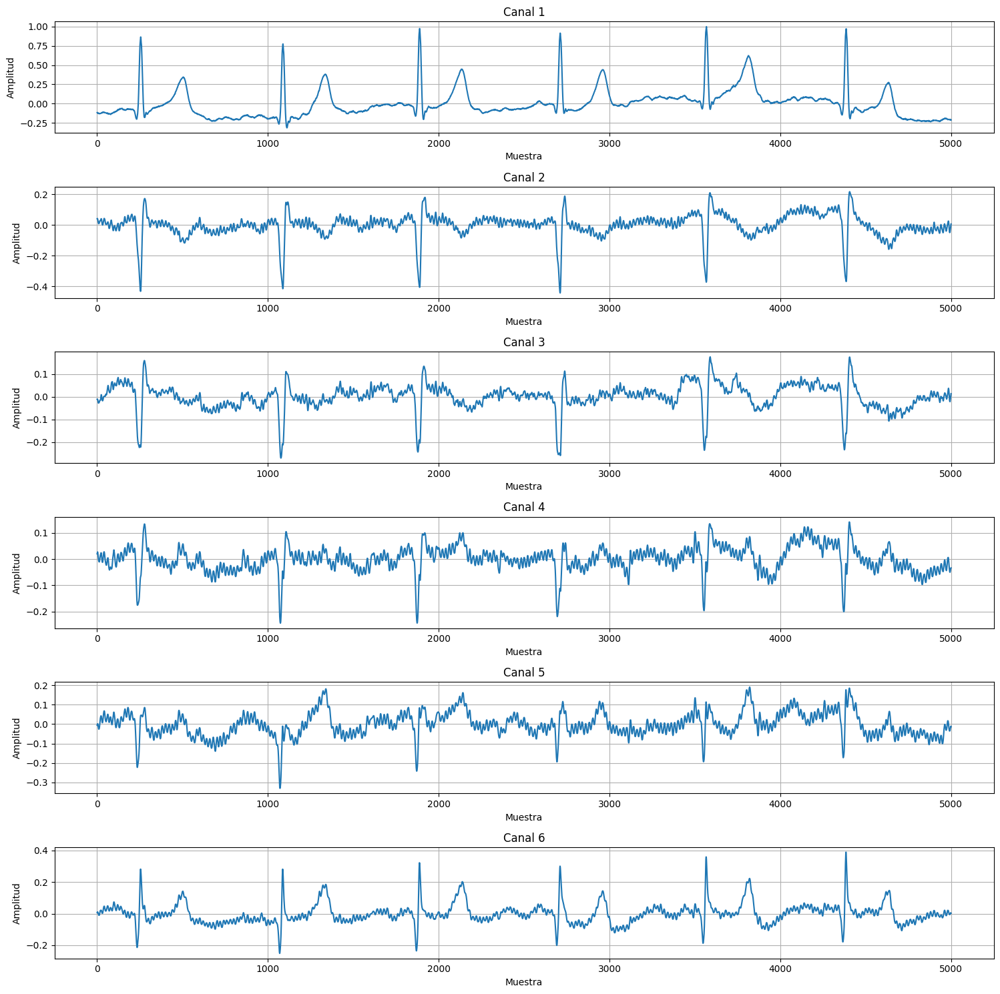

In [6]:
# Graficar todos los canales en subplots
plt.figure(figsize=(15, 2.5 * n_channels))
for i in range(n_channels):
    plt.subplot(n_channels, 1, i + 1)
    plt.plot(nr_signals[:, i])
    plt.title(f'Canal {i+1}')
    plt.xlabel('Muestra')
    plt.ylabel('Amplitud')
    plt.grid(True)

plt.tight_layout()
plt.show()

In [7]:
def plot_fft(signal, fs):
    n = len(signal)
    freq = np.fft.fftfreq(n, d=1/fs)
    fft_signal = np.fft.fft(signal)
    magnitude = np.abs(fft_signal) / n
    magnitude_db = 20 * np.log10(magnitude)
    
    plt.figure(figsize=(10, 6))
    plt.plot(freq[:n//2], magnitude_db[:n//2])
    plt.title('Transformada de Fourier en Decibeles')
    plt.xlabel('Frecuencia [Hz]')
    plt.ylabel('Amplitud [dB]')
    plt.grid(True)
    plt.show()

In [8]:
def plot_spectrogram(signal, sample_rate, overlapping=0.75, window_type='hann', window_size=128):
    # Crear la ventana
    window = get_window(window_type, window_size)

    # Calcular el paso de la ventana en función del solapamiento
    noverlap = int(overlapping * window_size)

    # Calcular el espectrograma
    f, t, Sxx = spectrogram(signal, fs=sample_rate, window=window,
                            nperseg=window_size, noverlap=noverlap)

    # Graficar el espectrograma
    plt.figure(figsize=(10, 6))
    plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud')
    plt.title('Espectrograma')
    plt.ylabel('Frecuencia [Hz]')
    plt.xlabel('Tiempo [s]')
    plt.colorbar(label='Amplitud [dB]')
    plt.show()


In [9]:
from scipy.signal import find_peaks

def detect_peaks(signal, fs):
    # Asumir frecuencia cardíaca fetal entre 120 y 160 bpm
    min_rr_interval = 0.375  # Intervalo RR mínimo en segundos
    distance = int(min_rr_interval * fs)
    peaks, _ = find_peaks(signal, distance=distance)
    return peaks


Transformada de Fourier - ECG con Arritmia + Ruido


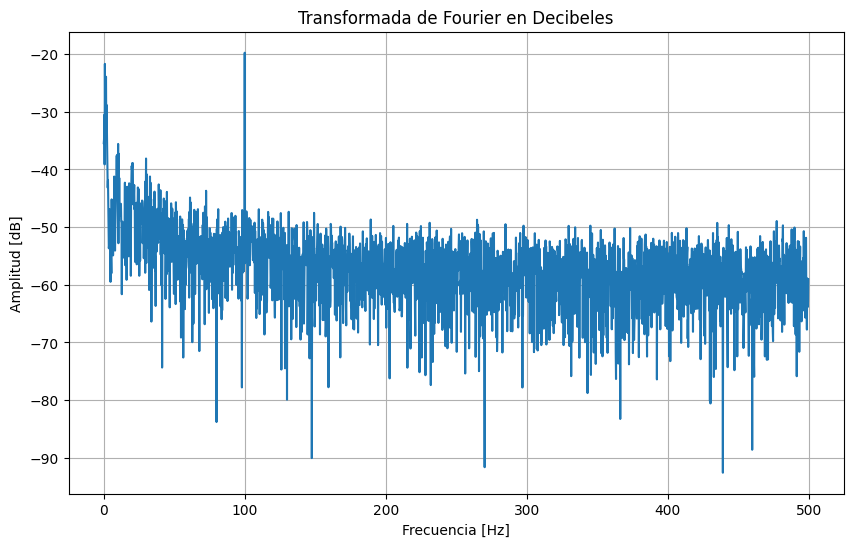

Transformada de Fourier - ECG Sano + Ruido


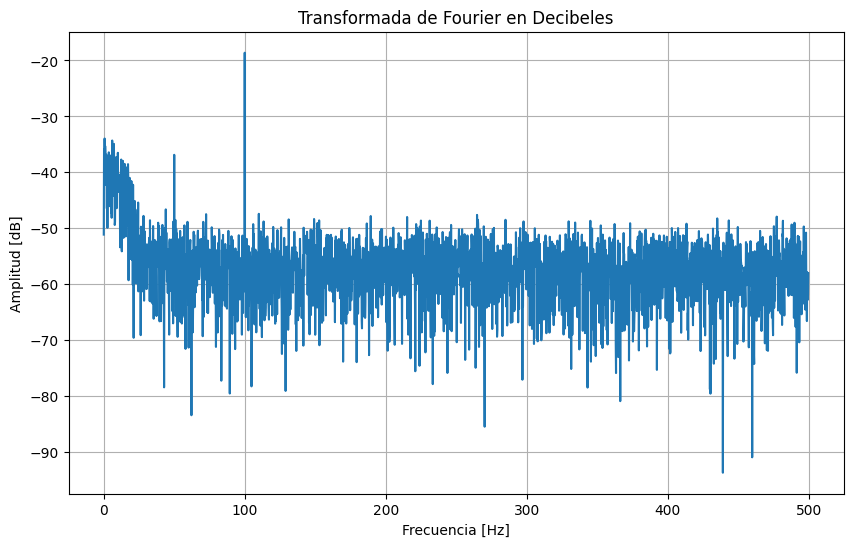

Espectrograma - ECG con Arritmia + Ruido


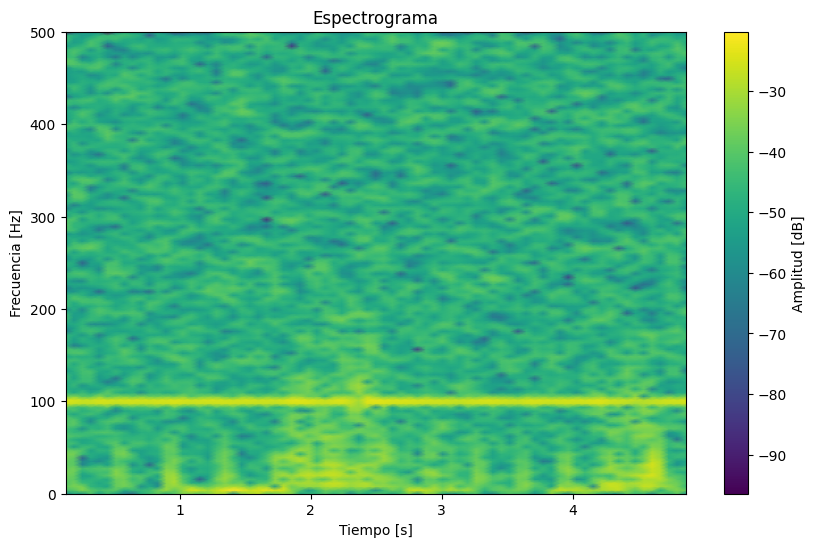

Espectrograma - ECG Sano + Ruido


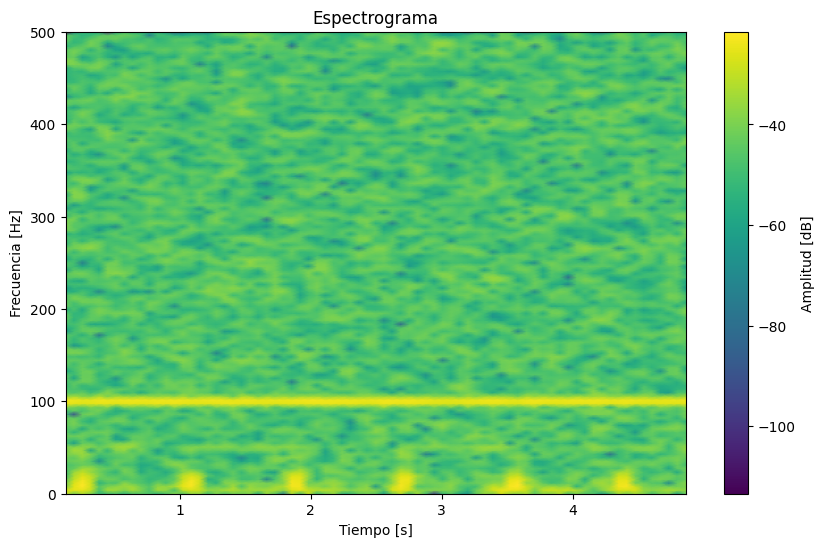

Detección de Picos - ECG con Arritmia + Ruido
Picos detectados en señal con arritmia: 10
Detección de Picos - ECG Sano + Ruido
Picos detectados en señal sana: 10


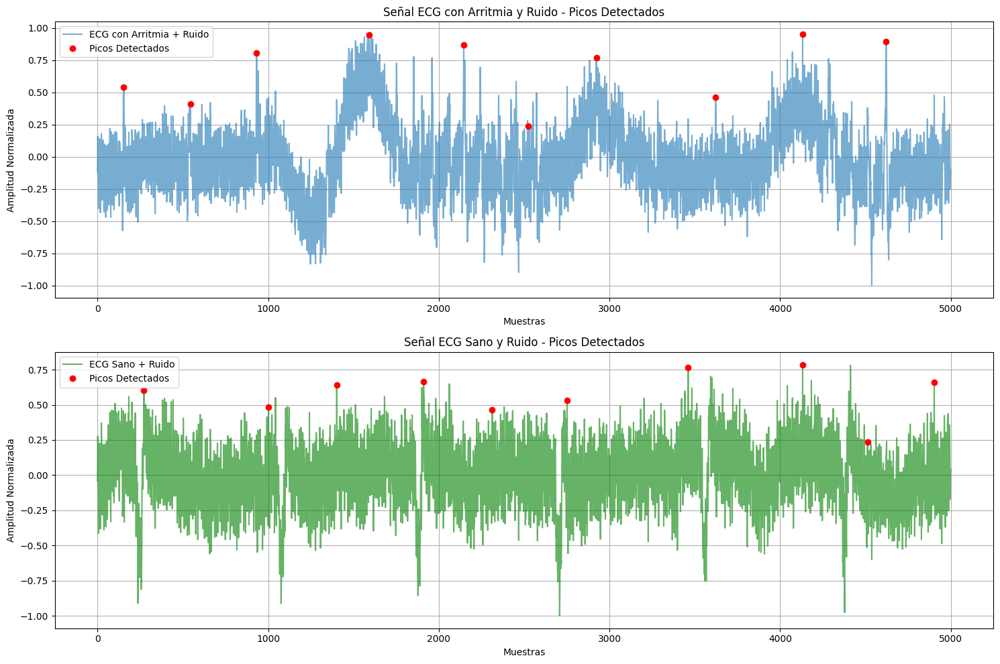

In [38]:
# Frecuencia de muestreo
fs = 1000  # Hz

# Aplicar y graficar la Transformada de Fourier en dB
print("Transformada de Fourier - ECG con Arritmia + Ruido")
plot_fft(noisy_arr_signal, fs)  # Título del gráfico: "Espectro de Frecuencia - ECG con Arritmia y Ruido"

print("Transformada de Fourier - ECG Sano + Ruido")
plot_fft(noisy_nr_signal, fs)  # Título del gráfico: "Espectro de Frecuencia - ECG Sano y Ruido"

# Generar y graficar el espectrograma
print("Espectrograma - ECG con Arritmia + Ruido")
plot_spectrogram(noisy_arr_signal, fs, overlapping=0.75, window_type='hann', window_size=256)  # Título del gráfico: "Espectrograma - ECG con Arritmia y Ruido"

print("Espectrograma - ECG Sano + Ruido")
plot_spectrogram(noisy_nr_signal, fs, overlapping=0.75, window_type='hann', window_size=256)  # Título del gráfico: "Espectrograma - ECG Sano y Ruido"

# Detectar picos (asumiendo que noisy_arr_signal y noisy_nr_signal están suavizadas para detectar los picos correctos)
print("Detección de Picos - ECG con Arritmia + Ruido")
arr_peaks = detect_peaks(noisy_arr_signal, fs)
print(f"Picos detectados en señal con arritmia: {len(arr_peaks)}")

print("Detección de Picos - ECG Sano + Ruido")
nr_peaks = detect_peaks(noisy_nr_signal, fs)
print(f"Picos detectados en señal sana: {len(nr_peaks)}")

# Graficar los picos detectados
plt.figure(figsize=(15, 10))

# ECG con arritmia
plt.subplot(2, 1, 1)
plt.plot(noisy_arr_signal, label='ECG con Arritmia + Ruido', alpha=0.6)
plt.plot(arr_peaks, noisy_arr_signal[arr_peaks], 'ro', label='Picos Detectados')
plt.title('Señal ECG con Arritmia y Ruido - Picos Detectados')
plt.xlabel('Muestras')
plt.ylabel('Amplitud Normalizada')
plt.legend()
plt.grid(True)

# ECG sano
plt.subplot(2, 1, 2)
plt.plot(noisy_nr_signal, label='ECG Sano + Ruido', alpha=0.6, color='green')
plt.plot(nr_peaks, noisy_nr_signal[nr_peaks], 'ro', label='Picos Detectados')
plt.title('Señal ECG Sano y Ruido - Picos Detectados')
plt.xlabel('Muestras')
plt.ylabel('Amplitud Normalizada')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


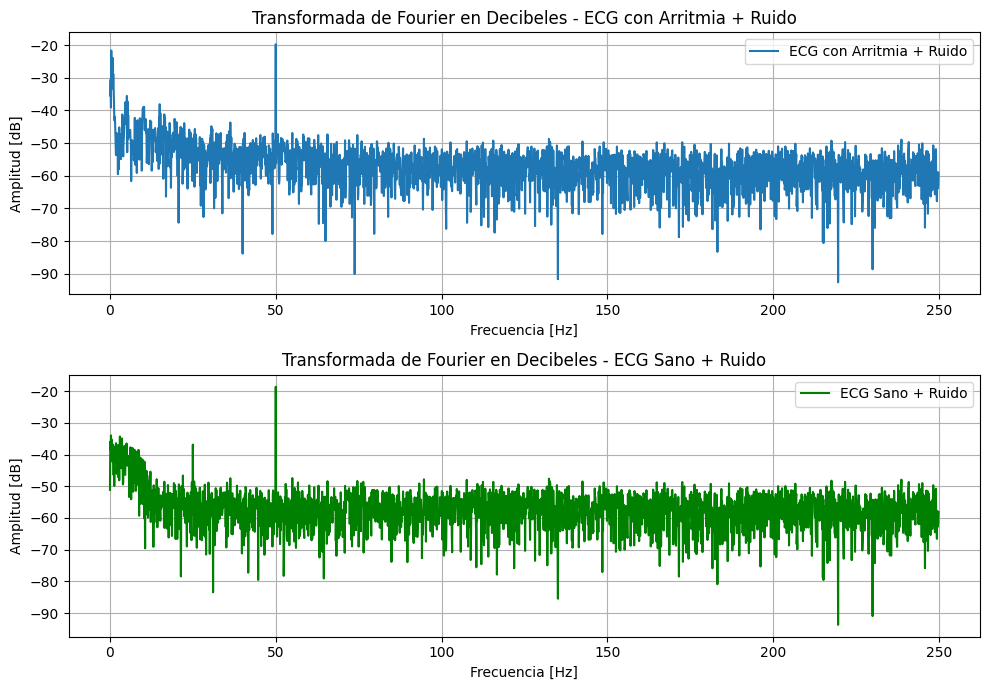

In [11]:
def plot_fft_comparison(signal1, signal2, fs, label1='Signal 1', label2='Signal 2'):
    n1 = len(signal1)
    n2 = len(signal2)
    
    freq1 = np.fft.fftfreq(n1, d=1/fs)
    freq2 = np.fft.fftfreq(n2, d=1/fs)
    
    fft_signal1 = np.fft.fft(signal1)
    fft_signal2 = np.fft.fft(signal2)
    
    magnitude1 = np.abs(fft_signal1) / n1
    magnitude2 = np.abs(fft_signal2) / n2
    
    magnitude_db1 = 20 * np.log10(magnitude1)
    magnitude_db2 = 20 * np.log10(magnitude2)
    
    plt.figure(figsize=(10, 7))
    
    # Primer subplot para la primera señal
    plt.subplot(2, 1, 1)
    plt.plot(freq1[:n1//2], magnitude_db1[:n1//2], label=label1)
    plt.title('Transformada de Fourier en Decibeles - ' + label1)
    plt.xlabel('Frecuencia [Hz]')
    plt.ylabel('Amplitud [dB]')
    plt.legend()
    plt.grid(True)
    
    # Segundo subplot para la segunda señal
    plt.subplot(2, 1, 2)
    plt.plot(freq2[:n2//2], magnitude_db2[:n2//2], label=label2, color='green')
    plt.title('Transformada de Fourier en Decibeles - ' + label2)
    plt.xlabel('Frecuencia [Hz]')
    plt.ylabel('Amplitud [dB]')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

# Graficar la FFT de las dos señales en subplots
plot_fft_comparison(noisy_arr_signal, noisy_nr_signal, fs, label1='ECG con Arritmia + Ruido', label2='ECG Sano + Ruido')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


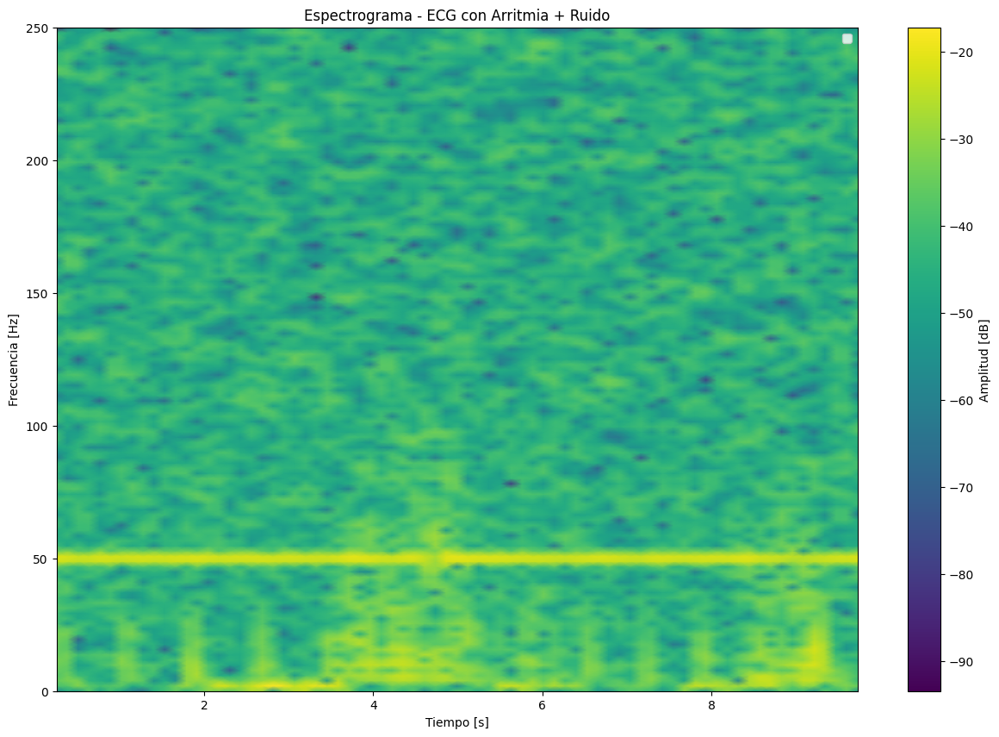

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


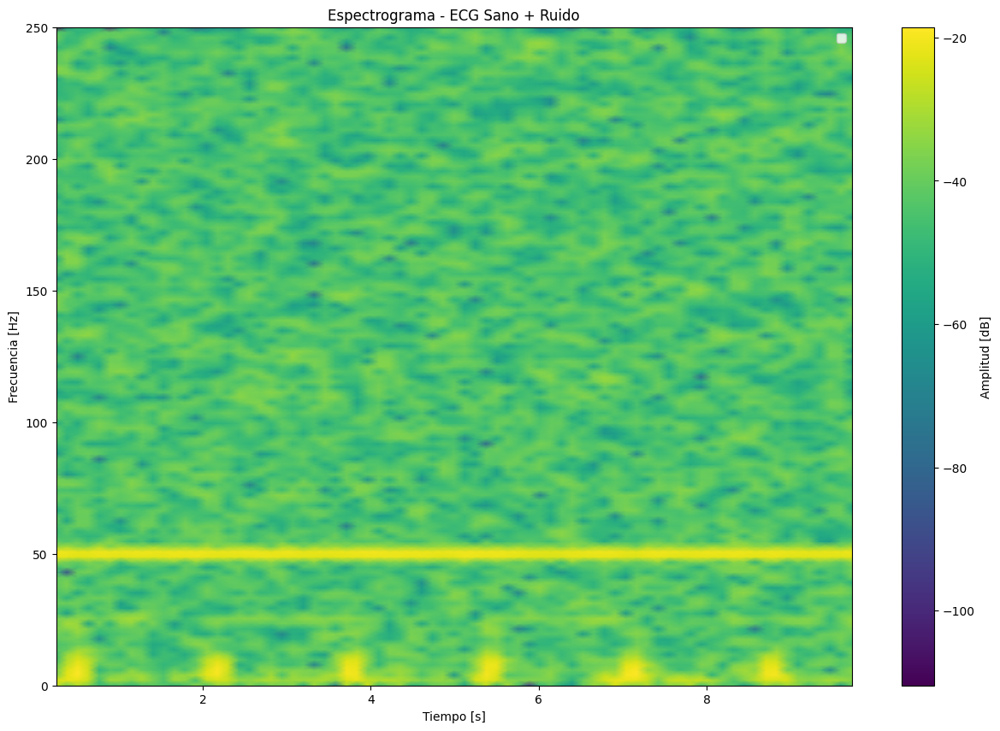

In [12]:
# Graficar el espectrograma y los picos detectados
def plot_spectrogram_with_peaks(signal, sample_rate, peaks, title):
    # Crear la ventana
    window_type = 'hann'
    window_size = 256
    overlapping = 0.75
    window = get_window(window_type, window_size)
    noverlap = int(overlapping * window_size)

    # Calcular el espectrograma
    f, t, Sxx = spectrogram(signal, fs=sample_rate, window=window, nperseg=window_size, noverlap=noverlap)

    # Graficar el espectrograma
    plt.figure(figsize=(15, 10))
    plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud')
    plt.title(title)
    plt.ylabel('Frecuencia [Hz]')
    plt.xlabel('Tiempo [s]')
    plt.colorbar(label='Amplitud [dB]')
    plt.legend()
    plt.show()

# Espectrograma y picos para ECG con arritmia y ruido
plot_spectrogram_with_peaks(noisy_arr_signal, fs, arr_peaks, 'Espectrograma - ECG con Arritmia + Ruido')

# Espectrograma y picos para ECG sano y ruido
plot_spectrogram_with_peaks(noisy_nr_signal, fs, nr_peaks, 'Espectrograma - ECG Sano + Ruido')

In [13]:
def calculate_snr(original_signal, noisy_signal):
    signal_power = np.mean(original_signal ** 2)
    noise_power = np.mean((original_signal - noisy_signal) ** 2)
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

def calculate_mse(original_signal, processed_signal):
    mse = np.mean((original_signal - processed_signal) ** 2)
    return mse

In [14]:
from scipy.signal import butter, filtfilt

def butter_filter(signal, cutoff, fs, order=4, filter_type='low'):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype=filter_type, analog=False)
    filtered_signal = filtfilt(b, a, signal)
    return filtered_signal


In [15]:
def fir_filter(signal, cutoff, fs, numtaps=101, filter_type='lowpass'):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    coeffs = firwin(numtaps, normal_cutoff, window='hamming', pass_zero=filter_type)
    filtered_signal = lfilter(coeffs, 1.0, signal)
    return filtered_signal


In [16]:
def fft_filter(signal, fs, cutoff_low, cutoff_high):
    n = len(signal)
    n_padded = n * 2
    freq = np.fft.fftfreq(n_padded, d=1/fs)
    signal_fft = np.fft.fft(signal, n=n_padded)

    mask = np.zeros(n_padded)
    mask[(freq >= cutoff_high) & (freq <= cutoff_low)] = 1

    filtered_fft = signal_fft * mask
    filtered_signal = np.fft.ifft(filtered_fft)
    filtered_signal = np.real(filtered_signal[:n])
    return filtered_signal


In [17]:
# Calcular SNR y MSE antes del filtrado para la señal con arritmia
snr_arr_before = calculate_snr(arr_signals[:, 2], noisy_arr_signal)
mse_arr_before = calculate_mse(arr_signals[:, 2], noisy_arr_signal)

# Calcular SNR y MSE antes del filtrado para la señal sana
snr_nr_before = calculate_snr(nr_signals[:, 2], noisy_nr_signal)
mse_nr_before = calculate_mse(nr_signals[:, 2], noisy_nr_signal)

# Imprimir resultados de SNR y MSE antes del filtrado
print(f"Resultados antes del filtrado para la Señal con Arritmia:")
print(f"  SNR antes del filtrado: {snr_arr_before:.2f} dB")
print(f"  MSE antes del filtrado: {mse_arr_before:.6f}\n")

print(f"Resultados antes del filtrado para la Señal Sana:")
print(f"  SNR antes del filtrado: {snr_nr_before:.2f} dB")
print(f"  MSE antes del filtrado: {mse_nr_before:.6f}\n")


Resultados antes del filtrado para la Señal con Arritmia:
  SNR antes del filtrado: -5.76 dB
  MSE antes del filtrado: 0.045812

Resultados antes del filtrado para la Señal Sana:
  SNR antes del filtrado: -11.48 dB
  MSE antes del filtrado: 0.046723



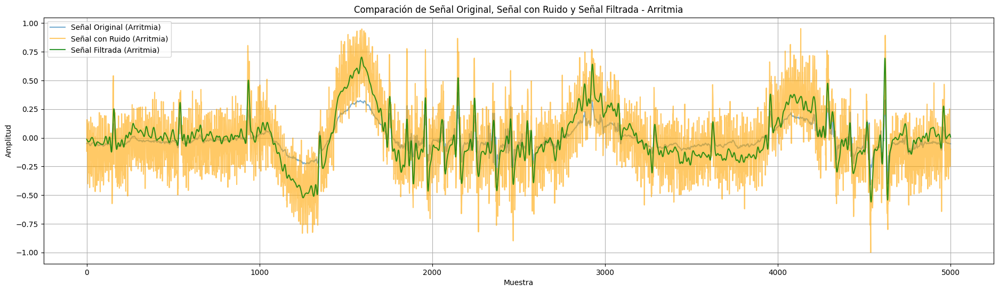

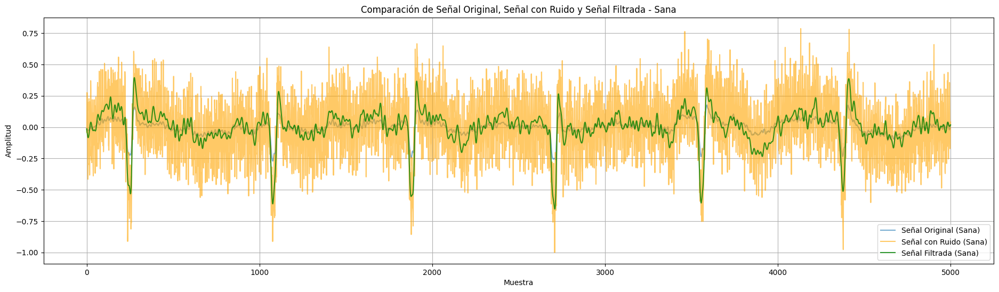

Resultados para la Señal con Arritmia:
  SNR después del filtrado: -0.59 dB
  MSE después del filtrado: 0.013952
Resultados para la Señal Sana:
  SNR después del filtrado: -2.89 dB
  MSE después del filtrado: 0.006459


In [18]:
from scipy.signal import firwin, lfilter
import time

# Parámetros de la señal
fs = 1000  # Frecuencia de muestreo
cutoff_low = 50  # Frecuencia de corte para el filtro pasa-bajas (Hz)
cutoff_high = 0.5  # Frecuencia de corte para el filtro pasa-altas (Hz)

# Filtrar la señal con ruido de arritmia
filtered_signal_arr_low = butter_filter(noisy_arr_signal, cutoff_low, fs, order=5, filter_type='low')
filtered_signal_arr = butter_filter(filtered_signal_arr_low, cutoff_high, fs, order=5, filter_type='high')

# Filtrar la señal con ruido sana
filtered_signal_nr_low = butter_filter(noisy_nr_signal, cutoff_low, fs, order=5, filter_type='low')
filtered_signal_nr = butter_filter(filtered_signal_nr_low, cutoff_high, fs, order=5, filter_type='high')

# Calcular SNR y MSE para ambas señales
snr_arr = calculate_snr(arr_signals[:, 2], filtered_signal_arr)
mse_arr = calculate_mse(arr_signals[:, 2], filtered_signal_arr)

snr_nr = calculate_snr(nr_signals[:, 2], filtered_signal_nr)
mse_nr = calculate_mse(nr_signals[:, 2], filtered_signal_nr)


# Graficar las señales con ruido y filtradas para la señal de arritmia
plt.figure(figsize=(23, 6))
plt.plot(arr_signals[:, 2], label='Señal Original (Arritmia)', alpha=0.6)
plt.plot(noisy_arr_signal, label='Señal con Ruido (Arritmia)', alpha=0.6, color='orange')
plt.plot(filtered_signal_arr, label='Señal Filtrada (Arritmia)', alpha=0.8, color='green')
plt.xlabel('Muestra')
plt.ylabel('Amplitud')
plt.title('Comparación de Señal Original, Señal con Ruido y Señal Filtrada - Arritmia')
plt.legend()
plt.grid(True)
plt.show()

# Graficar las señales con ruido y filtradas para la señal sana
plt.figure(figsize=(23, 6))
plt.plot(nr_signals[:, 2], label='Señal Original (Sana)', alpha=0.6)
plt.plot(noisy_nr_signal, label='Señal con Ruido (Sana)', alpha=0.6, color='orange')
plt.plot(filtered_signal_nr, label='Señal Filtrada (Sana)', alpha=0.8, color='green')
plt.xlabel('Muestra')
plt.ylabel('Amplitud')
plt.title('Comparación de Señal Original, Señal con Ruido y Señal Filtrada - Sana')
plt.legend()
plt.grid(True)
plt.show()

# Imprimir resultados de SNR y MSE
print(f"Resultados para la Señal con Arritmia:")
print(f"  SNR después del filtrado: {snr_arr:.2f} dB")
print(f"  MSE después del filtrado: {mse_arr:.6f}")

print(f"Resultados para la Señal Sana:")
print(f"  SNR después del filtrado: {snr_nr:.2f} dB")
print(f"  MSE después del filtrado: {mse_nr:.6f}")

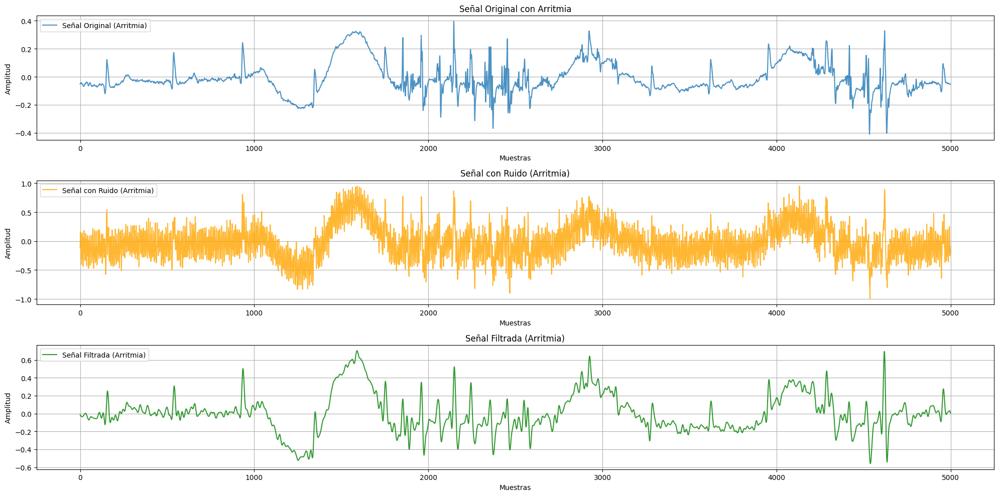

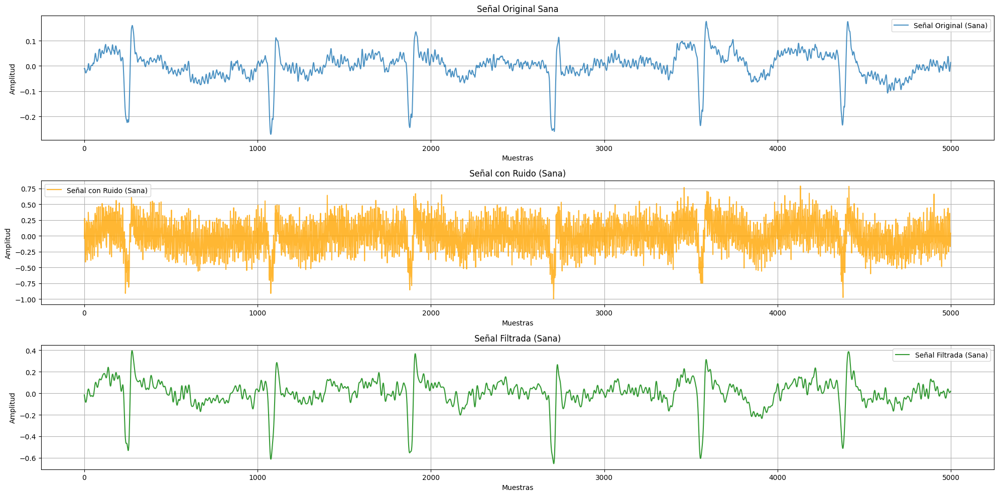

In [19]:
# Graficar comparación de las señales con arritmia
plt.figure(figsize=(20, 10))

# Señal original con arritmia
plt.subplot(3, 1, 1)
plt.plot(arr_signals[:, 2], label='Señal Original (Arritmia)', alpha=0.8)
plt.title('Señal Original con Arritmia')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

# Señal con ruido
plt.subplot(3, 1, 2)
plt.plot(noisy_arr_signal, label='Señal con Ruido (Arritmia)', alpha=0.8, color='orange')
plt.title('Señal con Ruido (Arritmia)')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

# Señal filtrada
plt.subplot(3, 1, 3)
plt.plot(filtered_signal_arr, label='Señal Filtrada (Arritmia)', alpha=0.8, color='green')
plt.title('Señal Filtrada (Arritmia)')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Graficar comparación de las señales sanas
plt.figure(figsize=(20, 10))

# Señal original sana
plt.subplot(3, 1, 1)
plt.plot(nr_signals[:, 2], label='Señal Original (Sana)', alpha=0.8)
plt.title('Señal Original Sana')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

# Señal con ruido
plt.subplot(3, 1, 2)
plt.plot(noisy_nr_signal, label='Señal con Ruido (Sana)', alpha=0.8, color='orange')
plt.title('Señal con Ruido (Sana)')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

# Señal filtrada
plt.subplot(3, 1, 3)
plt.plot(filtered_signal_nr, label='Señal Filtrada (Sana)', alpha=0.8, color='green')
plt.title('Señal Filtrada (Sana)')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

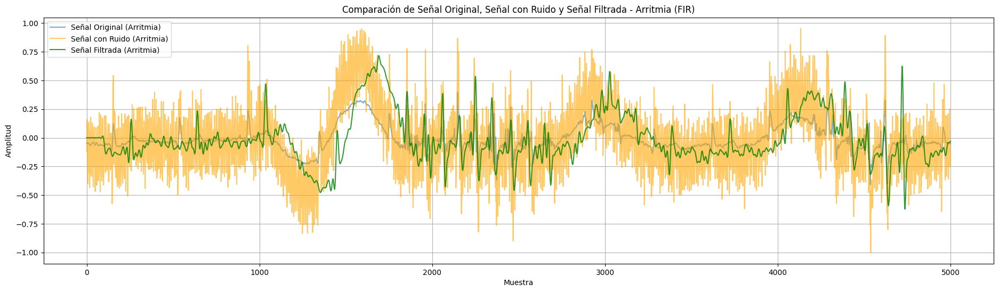

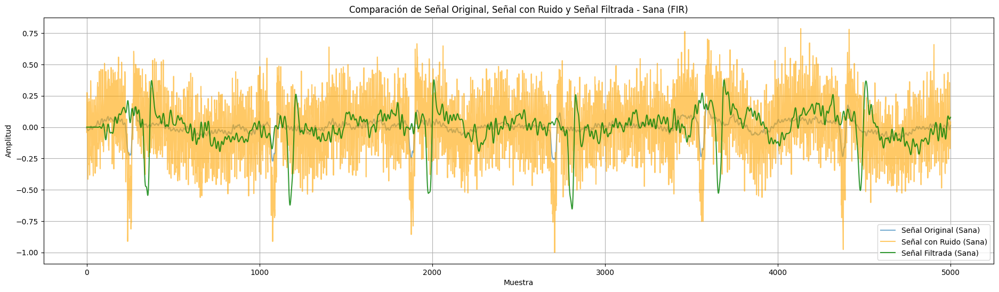

Resultados para la Señal con Arritmia:
  SNR después del filtrado: -3.76 dB
  MSE después del filtrado: 0.028924

Resultados para la Señal Sana:
  SNR después del filtrado: -7.56 dB
  MSE después del filtrado: 0.018936



In [20]:
from scipy.signal import firwin, lfilter

# Parámetros de la señal
fs = 1000  # Frecuencia de muestreo
cutoff_low = 50  # Frecuencia de corte para el filtro pasa-bajas (Hz)
cutoff_high = 0.5  # Frecuencia de corte para el filtro pasa-altas (Hz)
numtaps = 101  # Número de coeficientes del filtro FIR

# Filtrar la señal con ruido de arritmia
filtered_signal_arr_low = fir_filter(noisy_arr_signal, cutoff_low, fs, numtaps=numtaps, filter_type='lowpass')
filtered_signal_arr = fir_filter(filtered_signal_arr_low, cutoff_high, fs, numtaps=numtaps, filter_type='highpass')

# Filtrar la señal con ruido sana
filtered_signal_nr_low = fir_filter(noisy_nr_signal, cutoff_low, fs, numtaps=numtaps, filter_type='lowpass')
filtered_signal_nr = fir_filter(filtered_signal_nr_low, cutoff_high, fs, numtaps=numtaps, filter_type='highpass')

# Calcular SNR y MSE para ambas señales
snr_arr = calculate_snr(arr_signals[:, 2], filtered_signal_arr)
mse_arr = calculate_mse(arr_signals[:, 2], filtered_signal_arr)

snr_nr = calculate_snr(nr_signals[:, 2], filtered_signal_nr)
mse_nr = calculate_mse(nr_signals[:, 2], filtered_signal_nr)

# Graficar las señales con ruido y filtradas para la señal de arritmia
plt.figure(figsize=(23, 6))
plt.plot(arr_signals[:, 2], label='Señal Original (Arritmia)', alpha=0.6)
plt.plot(noisy_arr_signal, label='Señal con Ruido (Arritmia)', alpha=0.6, color='orange')
plt.plot(filtered_signal_arr, label='Señal Filtrada (Arritmia)', alpha=0.8, color='green')
plt.xlabel('Muestra')
plt.ylabel('Amplitud')
plt.title('Comparación de Señal Original, Señal con Ruido y Señal Filtrada - Arritmia (FIR)')
plt.legend()
plt.grid(True)
plt.show()

# Graficar las señales con ruido y filtradas para la señal sana
plt.figure(figsize=(23, 6))
plt.plot(nr_signals[:, 2], label='Señal Original (Sana)', alpha=0.6)
plt.plot(noisy_nr_signal, label='Señal con Ruido (Sana)', alpha=0.6, color='orange')
plt.plot(filtered_signal_nr, label='Señal Filtrada (Sana)', alpha=0.8, color='green')
plt.xlabel('Muestra')
plt.ylabel('Amplitud')
plt.title('Comparación de Señal Original, Señal con Ruido y Señal Filtrada - Sana (FIR)')
plt.legend()
plt.grid(True)
plt.show()

# Imprimir resultados de SNR y MSE
print(f"Resultados para la Señal con Arritmia:")
print(f"  SNR después del filtrado: {snr_arr:.2f} dB")
print(f"  MSE después del filtrado: {mse_arr:.6f}\n")

print(f"Resultados para la Señal Sana:")
print(f"  SNR después del filtrado: {snr_nr:.2f} dB")
print(f"  MSE después del filtrado: {mse_nr:.6f}\n")


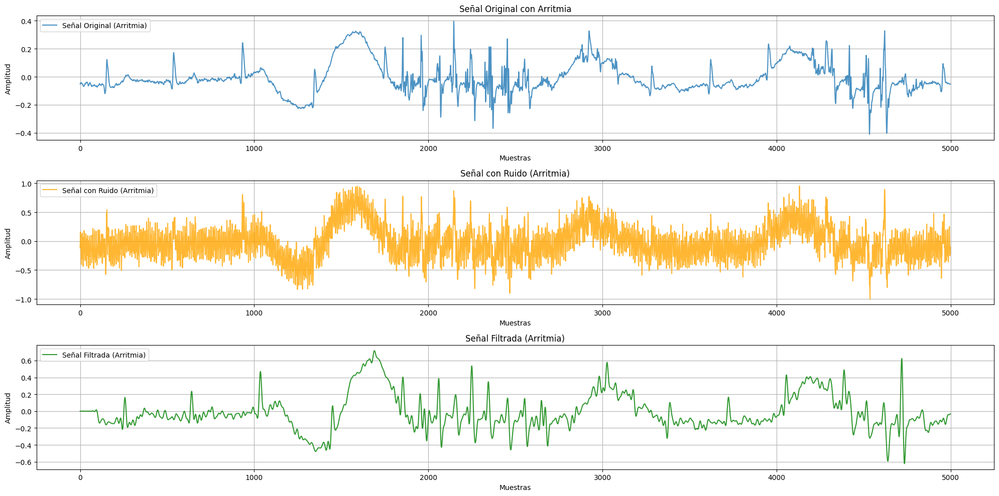

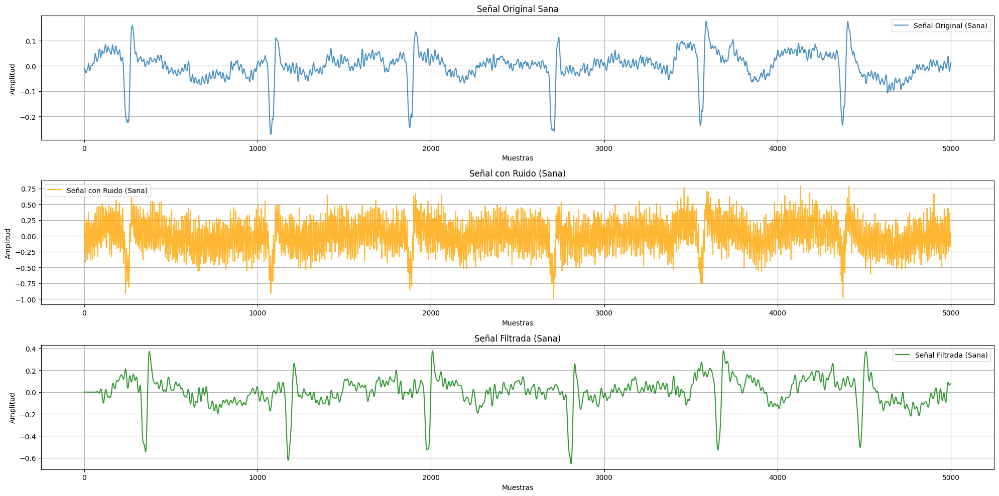

In [21]:
# Graficar comparación de las señales con arritmia
plt.figure(figsize=(20, 10))

# Señal original con arritmia
plt.subplot(3, 1, 1)
plt.plot(arr_signals[:, 2], label='Señal Original (Arritmia)', alpha=0.8)
plt.title('Señal Original con Arritmia')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

# Señal con ruido
plt.subplot(3, 1, 2)
plt.plot(noisy_arr_signal, label='Señal con Ruido (Arritmia)', alpha=0.8, color='orange')
plt.title('Señal con Ruido (Arritmia)')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

# Señal filtrada
plt.subplot(3, 1, 3)
plt.plot(filtered_signal_arr, label='Señal Filtrada (Arritmia)', alpha=0.8, color='green')
plt.title('Señal Filtrada (Arritmia)')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Graficar comparación de las señales sanas
plt.figure(figsize=(20, 10))

# Señal original sana
plt.subplot(3, 1, 1)
plt.plot(nr_signals[:, 2], label='Señal Original (Sana)', alpha=0.8)
plt.title('Señal Original Sana')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

# Señal con ruido
plt.subplot(3, 1, 2)
plt.plot(noisy_nr_signal, label='Señal con Ruido (Sana)', alpha=0.8, color='orange')
plt.title('Señal con Ruido (Sana)')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

# Señal filtrada
plt.subplot(3, 1, 3)
plt.plot(filtered_signal_nr, label='Señal Filtrada (Sana)', alpha=0.8, color='green')
plt.title('Señal Filtrada (Sana)')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

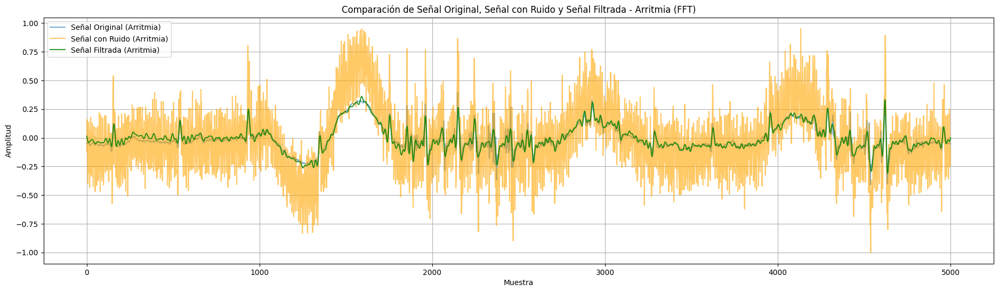

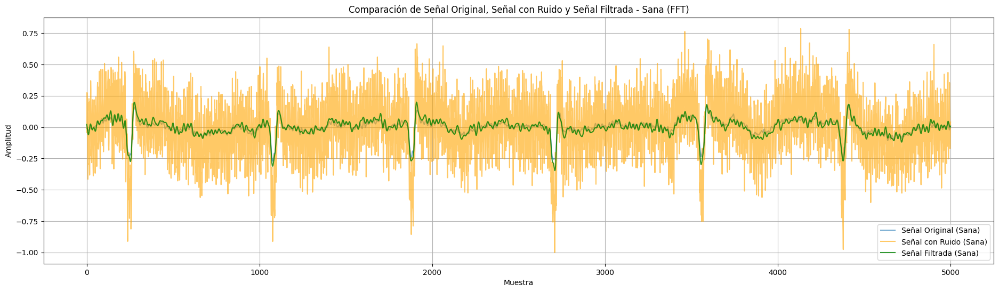

Resultados para la Señal con Arritmia:
  SNR después del filtrado: 10.09 dB
  MSE después del filtrado: 0.001193

Resultados para la Señal Sana:
  SNR después del filtrado: 8.23 dB
  MSE después del filtrado: 0.000499



In [22]:
# Parámetros de la señal
fs = 1000  # Frecuencia de muestreo
cutoff_low = 50  # Frecuencia de corte para el filtro pasa-bajas (Hz)
cutoff_high = 0.5  # Frecuencia de corte para el filtro pasa-altas (Hz)

# Filtrar la señal con ruido de arritmia
filtered_signal_arr = fft_filter(noisy_arr_signal, fs, cutoff_low, cutoff_high)

# Filtrar la señal con ruido sana
filtered_signal_nr = fft_filter(noisy_nr_signal, fs, cutoff_low, cutoff_high)

# Calcular SNR y MSE para ambas señales
snr_arr = calculate_snr(arr_signals[:, 2], filtered_signal_arr)
mse_arr = calculate_mse(arr_signals[:, 2], filtered_signal_arr)

snr_nr = calculate_snr(nr_signals[:, 2], filtered_signal_nr)
mse_nr = calculate_mse(nr_signals[:, 2], filtered_signal_nr)

# Graficar las señales con ruido y filtradas para la señal de arritmia
plt.figure(figsize=(23, 6))
plt.plot(arr_signals[:, 2], label='Señal Original (Arritmia)', alpha=0.6)
plt.plot(noisy_arr_signal, label='Señal con Ruido (Arritmia)', alpha=0.6, color='orange')
plt.plot(filtered_signal_arr, label='Señal Filtrada (Arritmia)', alpha=0.8, color='green')
plt.xlabel('Muestra')
plt.ylabel('Amplitud')
plt.title('Comparación de Señal Original, Señal con Ruido y Señal Filtrada - Arritmia (FFT)')
plt.legend()
plt.grid(True)
plt.show()

# Graficar las señales con ruido y filtradas para la señal sana
plt.figure(figsize=(23, 6))
plt.plot(nr_signals[:, 2], label='Señal Original (Sana)', alpha=0.6)
plt.plot(noisy_nr_signal, label='Señal con Ruido (Sana)', alpha=0.6, color='orange')
plt.plot(filtered_signal_nr, label='Señal Filtrada (Sana)', alpha=0.8, color='green')
plt.xlabel('Muestra')
plt.ylabel('Amplitud')
plt.title('Comparación de Señal Original, Señal con Ruido y Señal Filtrada - Sana (FFT)')
plt.legend()
plt.grid(True)
plt.show()

# Imprimir resultados de SNR y MSE
print(f"Resultados para la Señal con Arritmia:")
print(f"  SNR después del filtrado: {snr_arr:.2f} dB")
print(f"  MSE después del filtrado: {mse_arr:.6f}\n")

print(f"Resultados para la Señal Sana:")
print(f"  SNR después del filtrado: {snr_nr:.2f} dB")
print(f"  MSE después del filtrado: {mse_nr:.6f}\n")


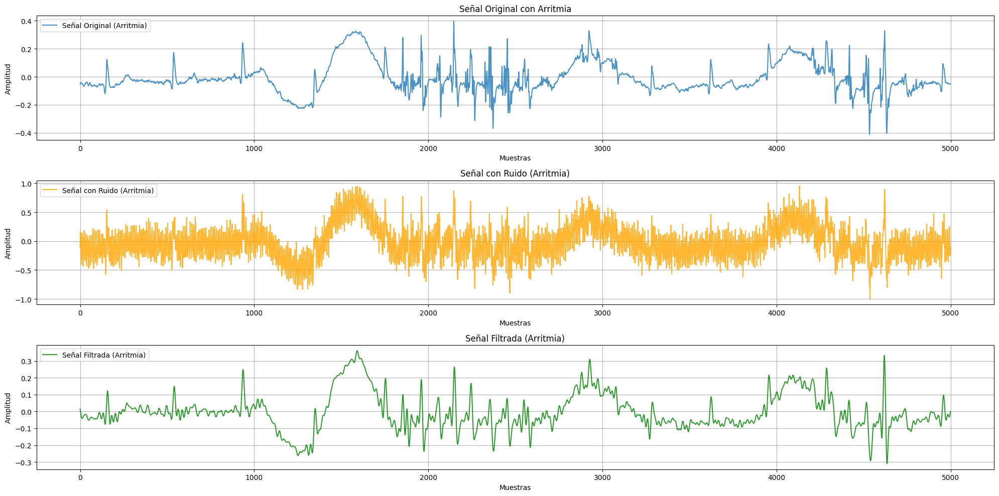

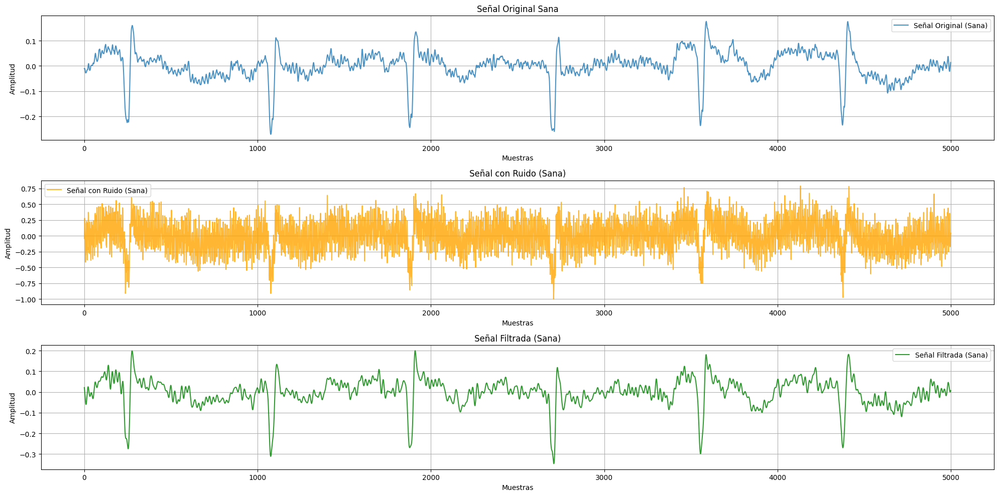

In [23]:
# Graficar comparación de las señales con arritmia
plt.figure(figsize=(20, 10))

# Señal original con arritmia
plt.subplot(3, 1, 1)
plt.plot(arr_signals[:, 2], label='Señal Original (Arritmia)', alpha=0.8)
plt.title('Señal Original con Arritmia')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

# Señal con ruido
plt.subplot(3, 1, 2)
plt.plot(noisy_arr_signal, label='Señal con Ruido (Arritmia)', alpha=0.8, color='orange')
plt.title('Señal con Ruido (Arritmia)')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

# Señal filtrada
plt.subplot(3, 1, 3)
plt.plot(filtered_signal_arr, label='Señal Filtrada (Arritmia)', alpha=0.8, color='green')
plt.title('Señal Filtrada (Arritmia)')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Graficar comparación de las señales sanas
plt.figure(figsize=(20, 10))

# Señal original sana
plt.subplot(3, 1, 1)
plt.plot(nr_signals[:, 2], label='Señal Original (Sana)', alpha=0.8)
plt.title('Señal Original Sana')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

# Señal con ruido
plt.subplot(3, 1, 2)
plt.plot(noisy_nr_signal, label='Señal con Ruido (Sana)', alpha=0.8, color='orange')
plt.title('Señal con Ruido (Sana)')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

# Señal filtrada
plt.subplot(3, 1, 3)
plt.plot(filtered_signal_nr, label='Señal Filtrada (Sana)', alpha=0.8, color='green')
plt.title('Señal Filtrada (Sana)')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


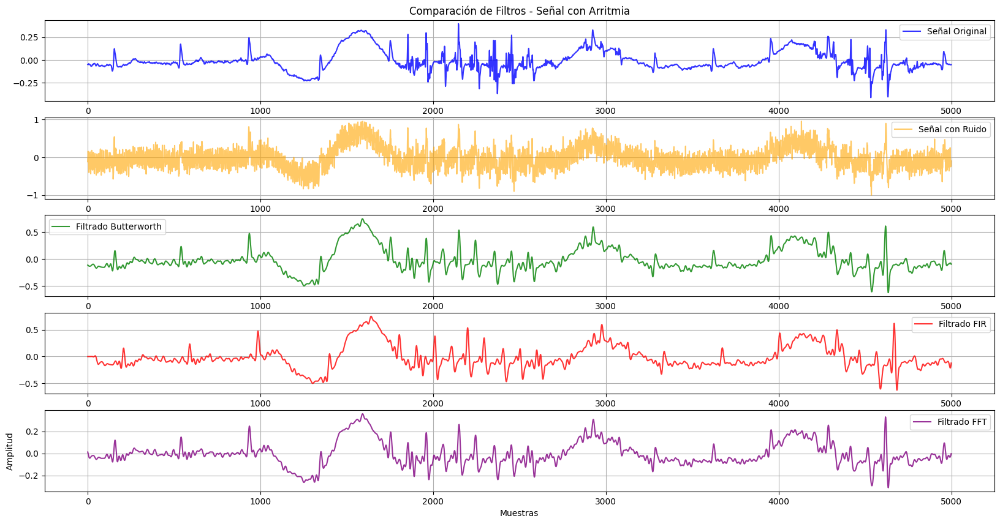

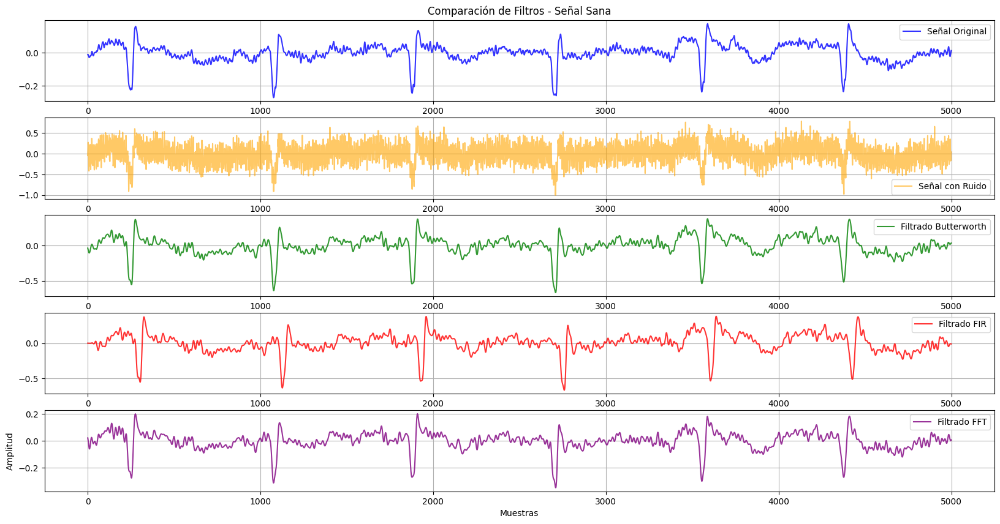

In [30]:
# Aplicar filtros a las señales con arritmia
butter_filtered_arr = butter_filter(noisy_arr_signal, cutoff_low, fs, order=5, filter_type='low')
fir_filtered_arr = fir_filter(noisy_arr_signal, cutoff_low, fs, numtaps=101, filter_type='lowpass')
fft_filtered_arr = fft_filter(noisy_arr_signal, fs, cutoff_low, cutoff_high)

# Graficar la comparación de filtros para la señal con arritmia
plt.figure(figsize=(20, 10))

plt.subplot(5, 1, 1)
plt.title('Comparación de Filtros - Señal con Arritmia')
plt.plot(arr_signals[:, 2], label='Señal Original', alpha=0.8, color='blue')
plt.legend()
plt.grid(True)

plt.subplot(5, 1, 2)

plt.plot(noisy_arr_signal, label='Señal con Ruido', alpha=0.6, color='orange')
plt.legend()
plt.grid(True)
plt.subplot(5, 1, 3)

plt.plot(butter_filtered_arr, label='Filtrado Butterworth', alpha=0.8, color='green')
plt.legend()
plt.grid(True)
plt.subplot(5, 1, 4)

plt.plot(fir_filtered_arr, label='Filtrado FIR', alpha=0.8, color='red')
plt.legend()
plt.grid(True)
plt.subplot(5, 1, 5)

plt.plot(fft_filtered_arr, label='Filtrado FFT', alpha=0.8, color='purple')
plt.legend()
plt.grid(True)


plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)
plt.show()

# Aplicar filtros a las señales sanas
butter_filtered_nr = butter_filter(noisy_nr_signal, cutoff_low, fs, order=5, filter_type='low')
fir_filtered_nr = fir_filter(noisy_nr_signal, cutoff_low, fs, numtaps=101, filter_type='lowpass')
fft_filtered_nr = fft_filter(noisy_nr_signal, fs, cutoff_low, cutoff_high)

# Graficar la comparación de filtros para la señal sana
plt.figure(figsize=(20, 10))

plt.subplot(5, 1, 1)
plt.title('Comparación de Filtros - Señal Sana')

plt.plot(nr_signals[:, 2], label='Señal Original', alpha=0.8, color='blue')
plt.legend()
plt.grid(True)
plt.subplot(5, 1, 2)

plt.plot(noisy_nr_signal, label='Señal con Ruido', alpha=0.6, color='orange')
plt.legend()
plt.grid(True)
plt.subplot(5, 1, 3)

plt.plot(butter_filtered_nr, label='Filtrado Butterworth', alpha=0.8, color='green')
plt.legend()
plt.grid(True)
plt.subplot(5, 1, 4)

plt.plot(fir_filtered_nr, label='Filtrado FIR', alpha=0.8, color='red')
plt.legend()
plt.grid(True)

plt.subplot(5, 1, 5)

plt.plot(fft_filtered_nr, label='Filtrado FFT', alpha=0.8, color='purple')
plt.legend()
plt.grid(True)

plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)
plt.show()


Media de Intervalos RR: 0.496 s
Desviación Estándar de Intervalos RR: 0.114 s


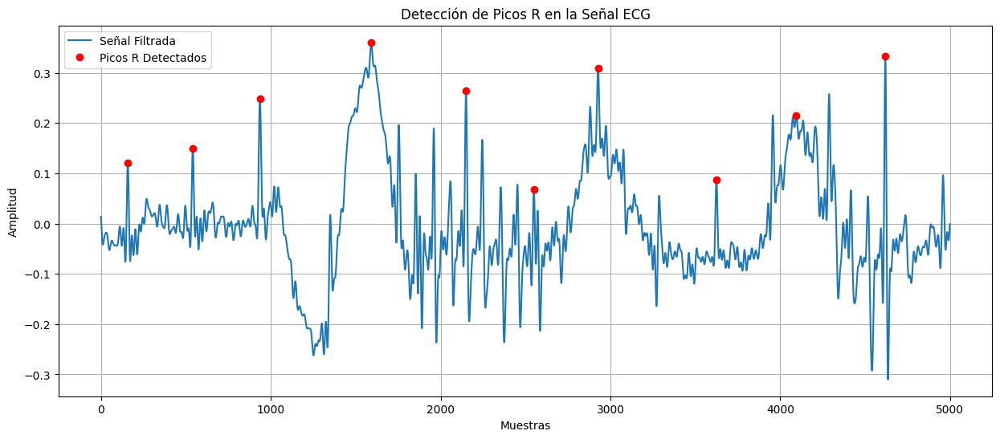

In [50]:
# Detectar los picos en la señal filtrada (por ejemplo, en noisy_arr_signal)
r_peaks = detect_peaks(fft_filtered_arr, fs)  # Intervalo mínimo de 0.5s entre picos
rr_intervals = np.diff(r_peaks) / fs  # Calcular intervalos RR en segundos

# Calcular estadísticas básicas
mean_rr = np.mean(rr_intervals)
std_rr = np.std(rr_intervals)

# Mostrar resultados
print(f"Media de Intervalos RR: {mean_rr:.3f} s")
print(f"Desviación Estándar de Intervalos RR: {std_rr:.3f} s")

# Graficar la señal con picos R detectados
plt.figure(figsize=(15, 6))
plt.plot(fft_filtered_arr, label='Señal Filtrada')
plt.plot(r_peaks, fft_filtered_arr[r_peaks], 'ro', label='Picos R Detectados')
plt.title('Detección de Picos R en la Señal ECG')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)
plt.show()

Media de Intervalos RR: 0.419 s
Desviación Estándar de Intervalos RR: 0.025 s


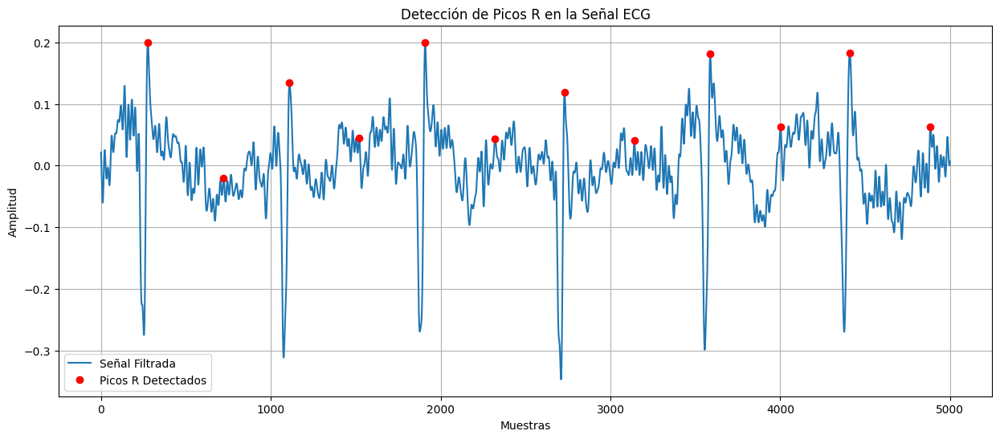

In [52]:
# Detectar los picos en la señal filtrada (por ejemplo, en noisy_arr_signal)
r_peaks = detect_peaks(fft_filtered_nr, fs)  # Intervalo mínimo de 0.5s entre picos
rr_intervals = np.diff(r_peaks) / fs  # Calcular intervalos RR en segundos

# Calcular estadísticas básicas
mean_rr = np.mean(rr_intervals)
std_rr = np.std(rr_intervals)

# Mostrar resultados
print(f"Media de Intervalos RR: {mean_rr:.3f} s")
print(f"Desviación Estándar de Intervalos RR: {std_rr:.3f} s")

# Graficar la señal con picos R detectados
plt.figure(figsize=(15, 6))
plt.plot(fft_filtered_nr, label='Señal Filtrada')
plt.plot(r_peaks, fft_filtered_nr[r_peaks], 'ro', label='Picos R Detectados')
plt.title('Detección de Picos R en la Señal ECG')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)
plt.show()

Media de Intervalos RR: 0.496 s
Desviación Estándar de Intervalos RR: 0.115 s


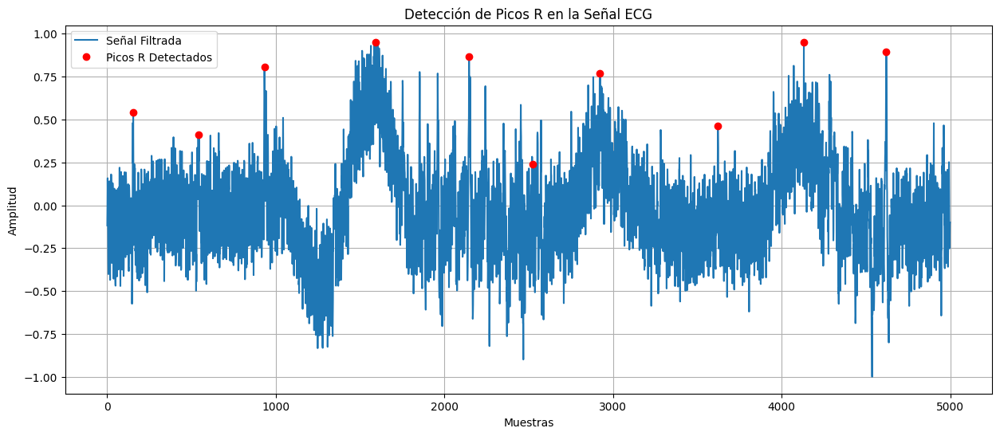

In [53]:
# Detectar los picos en la señal filtrada (por ejemplo, en noisy_arr_signal)
r_peaks = detect_peaks(noisy_arr_signal, fs)  # Intervalo mínimo de 0.5s entre picos
rr_intervals = np.diff(r_peaks) / fs  # Calcular intervalos RR en segundos

# Calcular estadísticas básicas
mean_rr = np.mean(rr_intervals)
std_rr = np.std(rr_intervals)

# Mostrar resultados
print(f"Media de Intervalos RR: {mean_rr:.3f} s")
print(f"Desviación Estándar de Intervalos RR: {std_rr:.3f} s")

# Graficar la señal con picos R detectados
plt.figure(figsize=(15, 6))
plt.plot(noisy_arr_signal, label='Señal Filtrada')
plt.plot(r_peaks, noisy_arr_signal[r_peaks], 'ro', label='Picos R Detectados')
plt.title('Detección de Picos R en la Señal ECG')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)
plt.show()

Media de Intervalos RR: 0.515 s
Desviación Estándar de Intervalos RR: 0.139 s


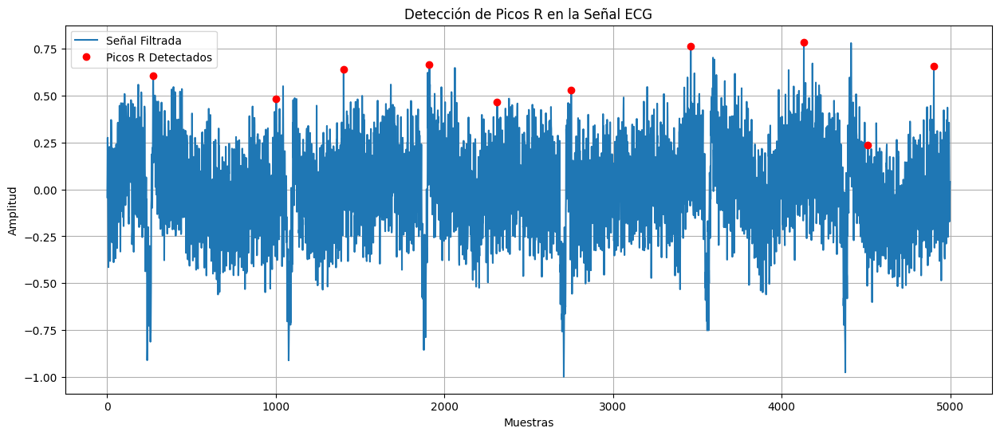

In [56]:
# Detectar los picos en la señal filtrada (por ejemplo, en noisy_arr_signal)
r_peaks = detect_peaks(noisy_nr_signal, fs)  # Intervalo mínimo de 0.5s entre picos
rr_intervals = np.diff(r_peaks) / fs  # Calcular intervalos RR en segundos

# Calcular estadísticas básicas
mean_rr = np.mean(rr_intervals)
std_rr = np.std(rr_intervals)

# Mostrar resultados
print(f"Media de Intervalos RR: {mean_rr:.3f} s")
print(f"Desviación Estándar de Intervalos RR: {std_rr:.3f} s")

# Graficar la señal con picos R detectados
plt.figure(figsize=(15, 6))
plt.plot(noisy_nr_signal, label='Señal Filtrada')
plt.plot(r_peaks, noisy_nr_signal[r_peaks], 'ro', label='Picos R Detectados')
plt.title('Detección de Picos R en la Señal ECG')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)
plt.show()

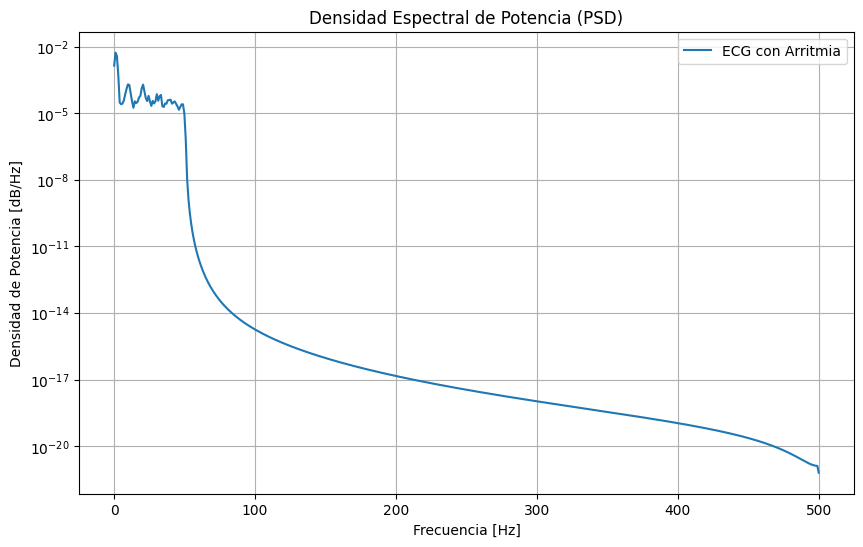

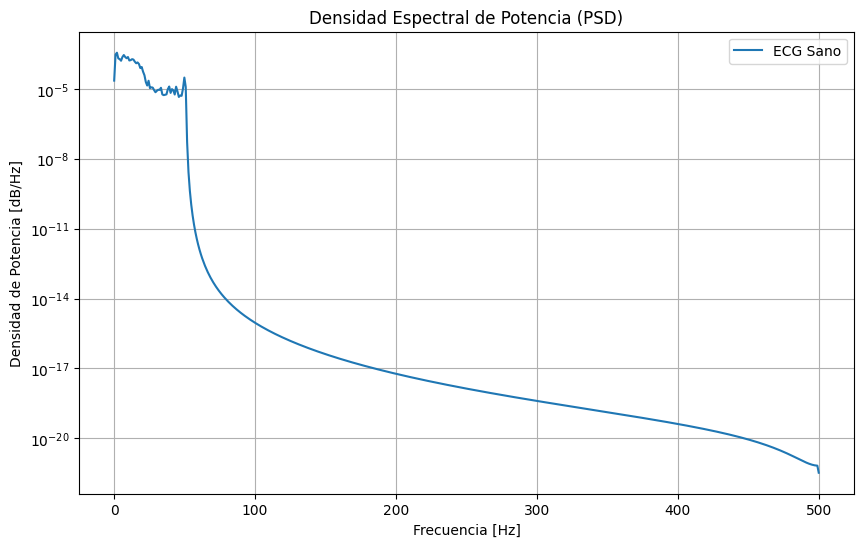

In [37]:
from scipy.signal import welch

# Función para graficar la PSD
def plot_psd(signal, fs, label):
    f, Pxx = welch(signal, fs, nperseg=1024)  # Calcular PSD usando Welch
    plt.figure(figsize=(10, 6))
    plt.semilogy(f, Pxx, label=label)
    plt.title('Densidad Espectral de Potencia (PSD)')
    plt.xlabel('Frecuencia [Hz]')
    plt.ylabel('Densidad de Potencia [dB/Hz]')
    plt.legend()
    plt.grid(True)
    plt.show()

# Aplicar la función a la señal con arritmia y sana
plot_psd(fft_filtered_arr, fs, label='ECG con Arritmia')
plot_psd(fft_filtered_nr, fs, label='ECG Sano')
